# 🐶Multi-Class Dog Breed Classification

This notebook builds an end-to-end multi-classs dog breed classification using Tensorflow 2.0 and Tensorflow Hub.


In [1]:
# Unzip the uploaded data into Google Drive
# !unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

### Get our workspace ready

* Import Tensorflow 2.x
* Import Tensorflow Hub
* Make sure we're using GPU

In [2]:
# Import necessary tools 
import tensorflow as tf
import tensorflow_hub as hub
print("TF version :" , tf.__version__)
print("TF Hub version :" , hub.__version__)

# Check for GPU availability
print("GPU" , "available (YES!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version : 2.8.2
TF Hub version : 0.12.0
GPU available (YES!!!)


## Getting the data ready ( turning into Tensors)

with all machine learning models, our data has to be in numerical form .. So that's what we'll be doing first . Turning our images into numbers . 
Let's start by accessing our data and checking out the labels.

In [3]:
# Checkout the labels of our data
import pandas as pd
labels_csv =  pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [4]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


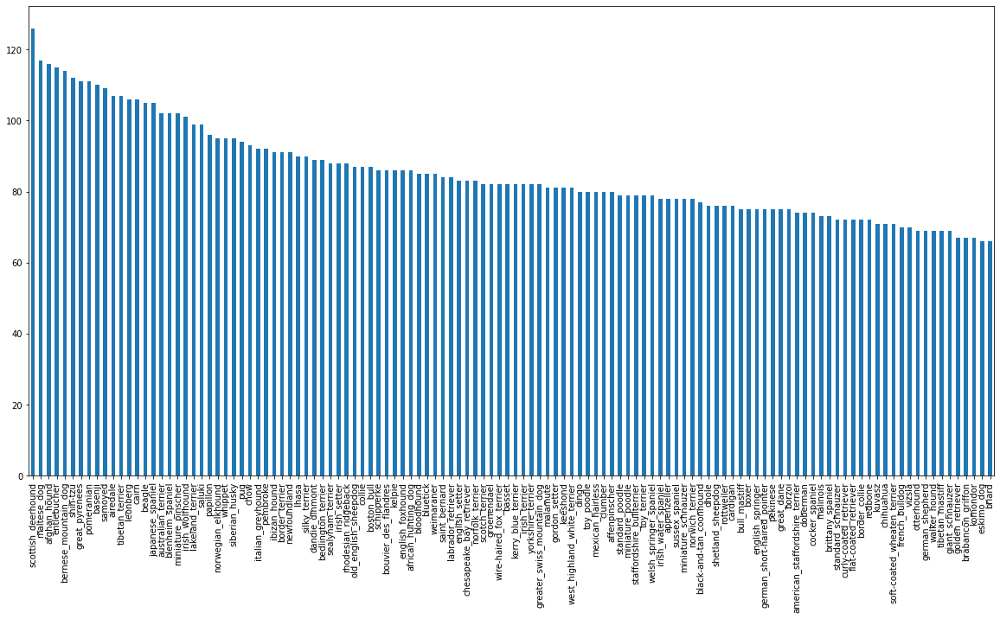

In [5]:
# How many images are there for each breed ?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [6]:
labels_csv["breed"].value_counts().median()

82.0

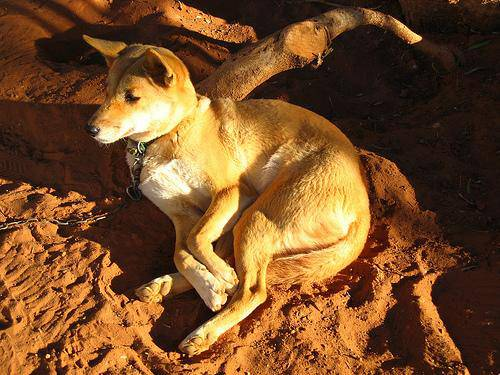

In [7]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels. 

Let's get a list of our image file pathnames.

In [8]:
# Create pathnames from image ID's
filenames =  ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/MyDrive/Dog Vision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/MyDrive/Dog Vision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/MyDrive/Dog Vision/train/00693b8bc2470375cc744a6391d397ec.jpg',
 'drive/MyDrive/Dog Vision/train/006cc3ddb9dc1bd827479569fcdc52d

In [9]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do not match actual amount of files , check the target directory")

Filenames match actual amount of files!!! Proceed.


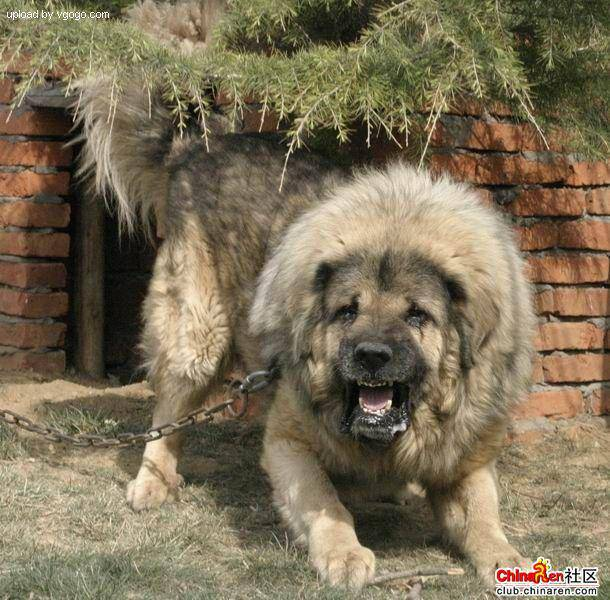

In [10]:
# One more check 
Image(filenames[9000])

In [11]:
labels_csv["breed"][9000]

'tibetan_mastiff'

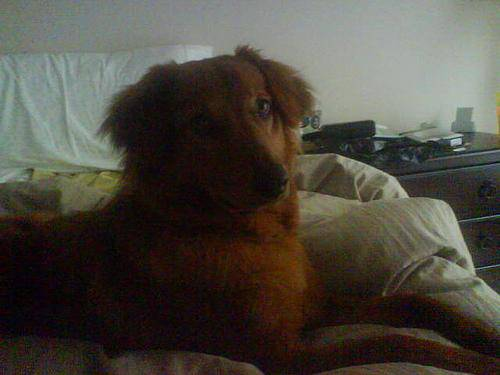

In [12]:
Image(filenames[1000])

Since we've now got our training image filepaths in a list , let's prepare our labels.

In [13]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
#labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [14]:
len(labels)

10222

In [15]:
# See if number of lables matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames")
else:
  print("Number of labels doesn't matches number of filenames")

Number of labels matches number of filenames


In [16]:
#bool(len(labels) == len(filenames))

In [17]:
# Find the unique label values
unique_breeds =  np.unique(labels)
len(unique_breeds)

120

In [18]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [19]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [20]:
len(boolean_labels)

10222

In [21]:
# Example : Turning boolean array into integers

print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occur in boolean array
print(boolean_labels[0].astype(int)) # there will be 1 where sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [22]:
print(labels[2])
print(boolean_labels[2].astype(int))


pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since the dataset from kaggle doesn't come with validation set so we'll create our own validation set

In [23]:
# Setup X $ y variables
X = filenames
y =  boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed.

In [24]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type : "slider"  , min : 1000 , max : 10000 , step :1000}

In [25]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val , y_train , y_val =  train_test_split(X[:NUM_IMAGES] ,
                                                     y[:NUM_IMAGES] ,
                                                     test_size = 0.2 ,
                                                     random_state = 42)

len(X_train) , len(y_train)  , len(X_val)  , len(y_val)

(800, 800, 200, 200)

In [26]:
# Let's have a geez at the training data
X_train[:5] , y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

# Preprocessing Images (Turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does few things:
1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable , 'image'.
3. Turn out 'image' (a jpg) into Tensors.
4. Normalize our image (convert color channel values from 0-255 to 0-1)
5. Resize the 'image' to be a shape of (224,224)
6. Return the modified image

In [27]:
# Let's convert image into numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [28]:
image.max()  , image.min()

(255, 0)

In [29]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [30]:
# turn image into tensors
tf.constant(image)[:2]


<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor , let's make a function to preprocess them.

In [31]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path , img_size = IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor
  """
  # Read in an image file 
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 color channels (Red,Green,Blue)
  image = tf.image.decode_jpeg(image , channels =3)
  # Convert the color channels values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224,224)
  image = tf.image.resize(image , size = [IMG_SIZE, IMG_SIZE])

  return image

## Turning the images into batches

Why turn our data into batches ?

Let's say you're trying to process 10,000+ images in one go...they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time ( you can manually adjust the batch size if need be).

In order to use Tensorflow effectively , we need our data in the form of Tensor tuples which look like this : (image , label).


In [32]:
# Create a simple function to return a tuple
def get_image_label(image_path , label):
  """
  Takes an image file path name and the associated label ,
  preprocess the image and returns a tuple.
  """
  image =  process_image(image_path)
  return image, label



In [33]:
(process_image(X[42]) , tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples. Let's make a function to turn all of our data (X & y) into batches

In [34]:
# Define the batch size , 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size = BATCH_SIZE , valid_data = False, test_data = False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but does not shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

    # If the data is a valid dataset , we don't need to shuffle it 
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                              tf.constant(y))) # labels
    data_batch =  data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches....")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y))) 
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size = len(X))
    # Create (image, label) tuples  (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)
    # Turn the training data into batches
    data_batch =  data.batch(BATCH_SIZE)
  return data_batch

  

In [35]:
# Create training and validation batches
train_data =  create_data_batches(X_train, y_train)
val_data =  create_data_batches(X_val, y_val , valid_data = True)

Creating training data batches....
Creating validation data batches...


In [36]:
train_data.element_spec , val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualising Data Batches 

Our data is now in batches , however , these can be a little hard to understand/comprehend , let's visualize them !



In [37]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup figure 
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows , 5 columns)
    ax =  plt.subplot(5,5,i+1)
    # Display image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [38]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [39]:
train_images , train_labels =  next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.12829852, 0.12829852, 0.03578041],
          [0.11583041, 0.12451185, 0.02854752],
          [0.20452276, 0.22020903, 0.12722701],
          ...,
          [0.9960785 , 0.9960785 , 0.9960785 ],
          [0.9960785 , 0.9960785 , 0.9960785 ],
          [0.9960785 , 0.9960785 , 0.9960785 ]],
 
         [[0.10926808, 0.09899819, 0.03666388],
          [0.13633423, 0.13252302, 0.07198755],
          [0.5913529 , 0.6009947 , 0.5299733 ],
          ...,
          [0.9960785 , 0.9960785 , 0.9960785 ],
          [0.9960785 , 0.9960785 , 0.9960785 ],
          [0.9960785 , 0.9960785 , 0.9960785 ]],
 
         [[0.17427687, 0.15758348, 0.14775236],
          [0.15880531, 0.14035152, 0.12153743],
          [0.23089269, 0.2267196 , 0.198873  ],
          ...,
          [0.9960785 , 0.9960785 , 0.9960785 ],
          [0.9960785 , 0.9960785 , 0.9960785 ],
          [0.9960785 , 0.9960785 , 0.9960785 ]],
 
         ...,
 
         [[0.12653035, 0.1914542 , 0.08357645],
          [0.07909

In [40]:
len(train_images)  , len(train_labels)

(32, 32)

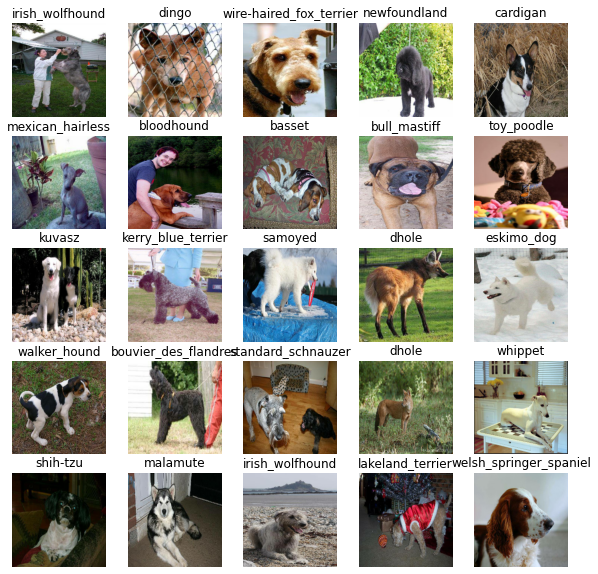

In [41]:
# Now let's visualize the  data in the training batch
show_25_images(train_images , train_labels)

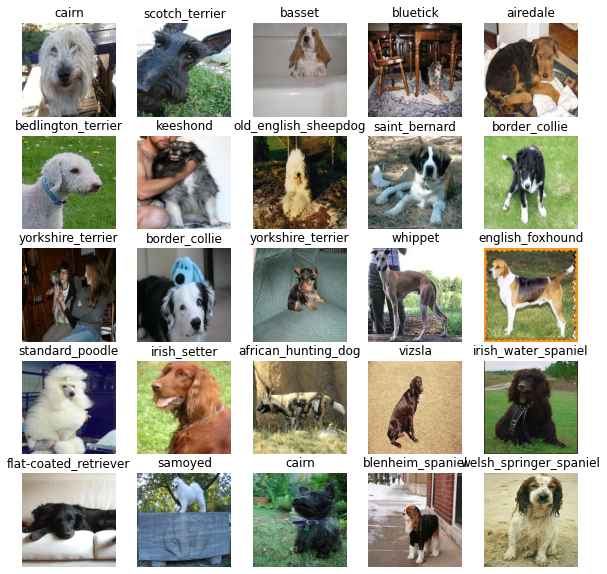

In [42]:
# Now let's visualise our validatioin sets
val_images , val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Building a model

Before we build a model , there are a few things we need to define:
* The input shape ( our images shape in the form of tensors) to our model.
* The output shape (image, labels , in the form of tensors) to our model.
* The URL of the model we want to use.

In [43]:
IMG_SIZE

224

In [44]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE , IMG_SIZE , 3] # batch , height , width , color channels

# Setup ouput shape of the model
OUTPUT_SHAPE =  len(unique_breeds)

# Setup model URL from tensorflow hub 
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"


Now we've got our inputs , outputs and model ready to go.
Let's put them together into a keras deep learning model ! 

Knowing this, let's create a function which:
* Takes the input shape , output shape and model we've choosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this , then that ).
* Compiles the model  ( says it should be evaluated and improved )
* Builds the model ( tells the model the input shape it'll be getting)
* Returns the model .

In [45]:
# Create a function which builds a keras model
def create_model(input_shape = INPUT_SHAPE , output_shape =  OUTPUT_SHAPE , model_url  =  MODEL_URL):
  print("Building model with :", MODEL_URL)

  # Setup the model layers
  model  =  tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer= tf.keras.optimizers.Adam(),
      metrics =  ["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [46]:
model =  create_model()
model.summary()

Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [47]:
outputs = np.ones(shape = (1,1,1280))
len(outputs)

1

## Creating Callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

we'll create two callbacks , one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a tensorboard callback , we need to do 3 things:
* Load the TensorBoard Extension
* Create a TensorBoard callback which is able to save logs to a directory and pass it to out model's fit() function.
* Visualize our models training logs with the %tensorboard magic function (we'll do this after model training).

In [48]:

# Load TensorBoard notebook extension
%load_ext tensorboard

In [49]:
import datetime

# Create a function to build TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing Tensorboard logs
  logdir = os.path.join("drive/My Drive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)


### Early stopping callback

Early stopping callback helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

In [50]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience =  3)

## Training a model (on subset of data)


Our first model is only going to train on 1000 images , to make sure everything is working.

In [51]:
NUM_EPOCHS = 100 #@param {type:"slider" , min:10, max:100, step:10}

In [52]:
# Check to make sure we are stilling running on a GPU
print("GPU" , "available (YES!!!!!)" if tf.config.list_physical_devices("GPU") else "not available")

GPU available (YES!!!!!)


Let's create function which trains a model .

1. Create a model using create_model()
2. Setup a Tensorboard callback using create_tensorboard_callback()
3. Call the fit() function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use.
4. Return the model


In [53]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model =  create_model()

  # Create a new TensorBoard session everytime we train a model.
  tensorboard =  create_tensorboard_callback()

  # FIt the model to the data passing it the callbacks we created
  model.fit(x=  train_data,
            epochs =  NUM_EPOCHS,
            validation_data =  val_data,
            validation_freq =1,
            callbacks =  [tensorboard, early_stopping])
  
  # Return the fitted model
  return model

In [54]:
# Fit the model to the data
model = train_model()

Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 116s 3s/step - loss: 4.6974 - accuracy: 0.0763 - val_loss: 3.4956 - val_accuracy: 0.2500
Epoch 2/100
25/25 [==============================] - 3s 129ms/step - loss: 1.7070 - accuracy: 0.6562 - val_loss: 2.1995 - val_accuracy: 0.4800
Epoch 3/100
25/25 [==============================] - 4s 153ms/step - loss: 0.5913 - accuracy: 0.9375 - val_loss: 1.7195 - val_accuracy: 0.5700
Epoch 4/100
25/25 [==============================] - 4s 154ms/step - loss: 0.2661 - accuracy: 0.9862 - val_loss: 1.5513 - val_accuracy: 0.6050
Epoch 5/100
25/25 [==============================] - 3s 132ms/step - loss: 0.1530 - accuracy: 0.9962 - val_loss: 1.4682 - val_accuracy: 0.6250
Epoch 6/100
25/25 [==============================] - 4s 154ms/step - loss: 0.1046 - accuracy: 0.9975 - val_loss: 1.4189 - val_accuracy: 0.6400
Epoch 7/100
25/25 [==============================

### Checking the Tensorboard logs

The Tensorboard magic function will access the logs directory we created earlier and visualize its contents.



In [55]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using the trained model

In [56]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [57]:
# Make predictions on validation data ( not used on train on)

predictions = model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 3s 107ms/step


array([[1.0270381e-03, 8.3961218e-05, 5.7845766e-04, ..., 4.4806936e-04,
        4.1809628e-05, 2.2626852e-03],
       [5.7772035e-04, 1.1236068e-03, 5.6165932e-03, ..., 4.7083358e-05,
        1.8642318e-03, 1.1006428e-04],
       [4.1690205e-06, 1.0139839e-05, 2.4803805e-06, ..., 2.5450561e-06,
        1.5218616e-06, 2.0696853e-05],
       ...,
       [3.7962650e-06, 1.3945670e-05, 2.1205129e-05, ..., 1.6603830e-05,
        6.0203798e-05, 1.9400359e-04],
       [2.7810847e-03, 4.9895042e-04, 2.8720446e-04, ..., 1.4434016e-04,
        2.6660171e-04, 1.8370934e-02],
       [1.5557105e-04, 5.8953269e-06, 9.5870183e-04, ..., 4.9770297e-04,
        3.6240497e-04, 1.4355288e-05]], dtype=float32)

In [58]:
predictions.shape

(200, 120)

In [59]:
len(y_val)

200

In [60]:
len(unique_breeds)

120

In [61]:
predictions[0].argmax()

17

In [62]:
np.sum(predictions[0])

0.9999999

In [63]:
len(predictions)

200

In [64]:
np.sum(predictions[1])

1.0

In [65]:
np.sum(predictions[2])

0.99999994

In [66]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediciton) : {np.max(predictions[index])}")
print(f"Sum:{np.sum(predictions[index])}")
print(f"Max index :{np.argmax(predictions[index])}")
print(f"Predicted Label: {unique_breeds[np.argmax(predictions[index])]}")

[2.89868301e-04 1.24929429e-04 4.28120838e-05 3.37228230e-05
 7.74367712e-04 7.74090513e-05 1.10621935e-04 9.46279382e-04
 7.89255742e-03 1.88420806e-02 1.41106048e-05 1.56258557e-05
 3.51910334e-04 2.33106269e-03 2.08835676e-03 1.04690460e-03
 3.58840007e-05 2.69285840e-04 9.03392647e-05 8.54684738e-04
 3.11322001e-05 3.04952322e-04 4.26218394e-05 2.34341314e-05
 1.28420163e-02 6.78006982e-05 8.76794002e-05 2.64989249e-05
 1.46047256e-04 4.03844206e-05 4.18234180e-04 1.29459091e-04
 1.44697638e-04 1.75436580e-05 4.14000315e-05 8.39893528e-06
 1.36409275e-04 1.45420461e-04 9.31280447e-05 2.42756322e-01
 1.03454142e-04 6.83576873e-05 6.74510235e-03 9.21957053e-06
 2.17484907e-04 3.23284330e-05 5.86222799e-04 8.03757750e-04
 4.51057713e-05 1.59329298e-04 1.44239952e-04 1.05136540e-04
 2.05858727e-04 1.12558797e-03 1.47369083e-05 3.84162006e-04
 6.32410301e-05 5.94880876e-05 7.09479427e-05 8.83869652e-05
 3.47124987e-05 8.39871122e-04 9.80807181e-06 1.82157619e-05
 2.27401149e-04 4.242240

In [67]:
unique_breeds[79]

'norfolk_terrier'

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediciton is being made on!

**Note:**  Prediction probabilities are also known as confidence levels.

In [68]:
# Turn prediction probabilities into their respective label (easier to understand)

def get_pred_label(prediction_proababilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_proababilities)]

# Get a predicted label based on an array of prediction probabilities 
pred_label  = get_pred_label(predictions[81])
pred_label


'dingo'

Since our validation dataset is still in a batch dataset, we'll have to unbatchify it to make predicitions on the validation images and then compare those predictions to the validation labels (truth labels)

In [69]:
val_data


<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [70]:
# Create to function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image,label) Tensor and return separate arrays of images and label
  """
  images = []
  labels = []
  # Loop through unbatched data 
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

# Unbatchify the validation dataset
val_images , val_labels =  unbatchify(val_data)
val_images[0] , val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [71]:
images_ = []
labels_ = []

# Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0] , labels_[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [72]:
get_pred_label(val_labels[0])

'affenpinscher'

In [73]:
get_pred_label(labels_[0])


'cairn'

In [74]:
get_pred_label(predictions[0])

'border_terrier'

Now we've got ways to get :
* Prediction labels 
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visualize.

We'll create a function which:
* Takes an array of prediction probablities , an array of truth labels and an array of images and integers.
* Convert the prediction probablities to a predicted label.
* Plot the predicted label, its predicted probablities , the truth label and the target image on a single plot.

In [75]:
def plot_pred(prediction_probabilities, labels, images,  n=1):
  """
  View the prediction , ground truth and image for sample n
  """
  pred_prob , true_label , image = prediction_probabilities[n] , labels[n] , images[n]
  
  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted , probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color = color)

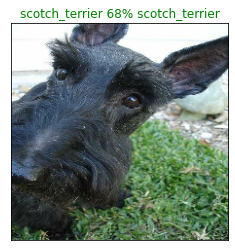

In [76]:
plot_pred(prediction_probabilities=predictions,
          labels= val_labels,
          images =  val_images)

Now we've got to visualize our model top prediction , let's make another to our models top 10 predictions .

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using get_pred_label()
* Find the top 10 :
       * Prediction Probabilities indexes
       * Prediction Probabilites values
       * Prediction labels
* Plot the top 10 prediction probablilities values and labels , coloring the true label green

In [77]:
def plot_pred_conf(prediction_probabilities , labels , n =1):
  """
  Plus the top 10 highest prediction confidence along with the truth table for sample n
  """
  pred_prob , true_label = prediction_probabilities[n] , labels[n]

  # Get the predicted label
  pred_label =  get_pred_label(pred_prob)

  # Find the top 10 predicion confidence indexes 
  top_10_pred_indexes =  pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values =  pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")
  
  # Change color of true label
  if np.isin(true_label , top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass





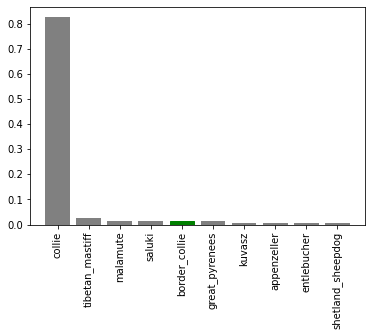

In [78]:
plot_pred_conf(prediction_probabilities=predictions,
               labels = val_labels,
               n =9 )

In [79]:
predictions[0]

array([1.02703809e-03, 8.39612185e-05, 5.78457664e-04, 3.22640954e-05,
       3.52317060e-04, 2.03594464e-05, 2.41219252e-03, 4.06357984e-04,
       3.41401377e-04, 4.13892820e-04, 3.36850964e-04, 2.55716208e-04,
       1.46691644e-04, 1.30824221e-04, 8.52220750e-04, 1.00543351e-04,
       1.70586500e-05, 4.54948604e-01, 9.03688415e-05, 3.07319970e-05,
       8.55879392e-04, 1.54715977e-04, 3.23688369e-06, 1.19080418e-03,
       1.07449181e-04, 2.20390080e-04, 9.75165889e-02, 4.13992857e-05,
       1.28729909e-03, 5.72631310e-04, 5.22695118e-05, 2.61663157e-03,
       5.63172332e-04, 2.47593853e-05, 6.75546762e-05, 2.18014438e-02,
       5.19624746e-06, 4.01200159e-05, 1.17557851e-04, 1.48703658e-03,
       4.61897696e-04, 9.60492689e-05, 3.83941224e-04, 1.64045661e-04,
       2.06449258e-05, 5.86761780e-05, 2.41332109e-05, 1.67206599e-04,
       2.51807287e-05, 1.26998857e-04, 1.35244642e-04, 2.43027825e-05,
       1.52906927e-04, 2.08750687e-04, 1.75310925e-04, 1.50847816e-04,
      

In [80]:
predictions[0].argsort()[-10:][::-1]


array([ 17,  59,  26, 102,  70,  77,  35,  65, 109, 106])

In [81]:
unique_breeds[predictions[0].argsort()[-10:][::-1]]

array(['border_terrier', 'irish_wolfhound', 'cairn', 'silky_terrier',
       'lhasa', 'miniature_schnauzer', 'dandie_dinmont', 'komondor',
       'tibetan_terrier', 'standard_schnauzer'], dtype=object)

Now we've got some functin to help us visualize our predictions and evaluate our models . let's check out a few

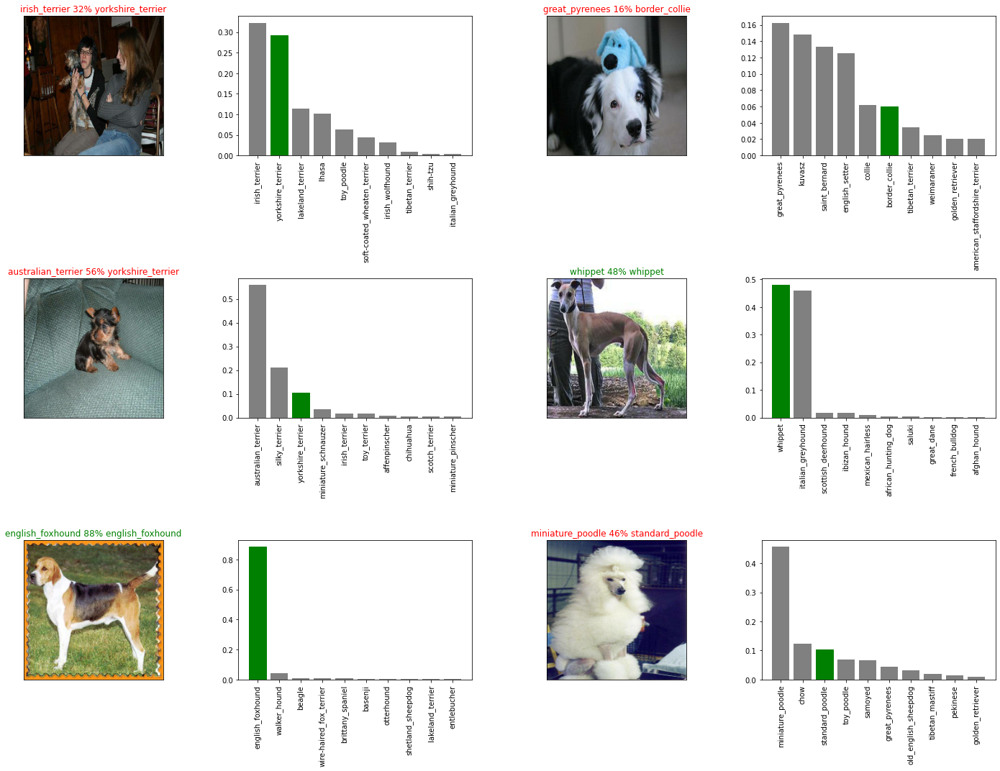

In [82]:
# Let's check out a few predictions and their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols , 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows , 2*num_cols , 2*i+1)
  plot_pred(prediction_probabilities=predictions,
           labels =  val_labels ,
           images = val_images,
           n = i+i_multiplier)
  plt.subplot(num_rows , 2*num_cols , 2*i+2)
  plot_pred_conf(prediction_probabilities = predictions,
                 labels = val_labels,
                 n = i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [83]:
from sklearn.metrics import confusion_matrix

## Saving and reloading a trained model

In [84]:
# Create a function to save the model
def save_model(model , suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string)
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path =  modeldir + "_" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path
  

In [85]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Load a saved model from speicified path
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"KerasLayer":hub.KerasLayer})
  return model

In [86]:
# Save our model trained on 1000 images
save_model(model , suffix = "1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20220827-08471661590056_1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20220827-08471661590056_1000-images-mobilenetv2-Adam.h5'

In [87]:
# Load a trained model
loaded_1000_images_model = load_model('drive/MyDrive/Dog Vision/models/20220826-16421661532133_1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Vision/models/20220826-16421661532133_1000-images-mobilenetv2-Adam.h5


In [88]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 100ms/step - loss: 1.3009 - accuracy: 0.6550


[1.3009437322616577, 0.6549999713897705]

In [89]:
# Evaluate the loaded model
loaded_1000_images_model.evaluate(val_data)

7/7 [==============================] - 1s 85ms/step - loss: 1.2630 - accuracy: 0.6450


[1.2630499601364136, 0.6449999809265137]

## Training a big dog model (on full data)

In [90]:
len(X) , len(y)

(10222, 10222)

In [91]:
X[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [92]:
len(X_train)

800

In [93]:
# Create a data batch with the full data set
full_data =  create_data_batches(X,y)

Creating training data batches....


In [94]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [95]:
# Create a model for full model
full_model =  create_model()

Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [96]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data ,so we can't monitor validation accuracy
full_model_early_stopping =  tf.keras.callbacks.EarlyStopping(monitor = "accuracy",
                                                              patience = 3)


Running the cell below will take a little while ( maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory

In [97]:
# Fit the full model to full data
full_model.fit(x = full_data , 
              epochs = NUM_EPOCHS,
              callbacks = [full_model_tensorboard , full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 40s 114ms/step - loss: 1.3392 - accuracy: 0.6690
Epoch 2/100
320/320 [==============================] - 35s 108ms/step - loss: 0.4090 - accuracy: 0.8761
Epoch 3/100
320/320 [==============================] - 35s 110ms/step - loss: 0.2421 - accuracy: 0.9343
Epoch 4/100
320/320 [==============================] - 37s 115ms/step - loss: 0.1571 - accuracy: 0.9632
Epoch 5/100
320/320 [==============================] - 38s 118ms/step - loss: 0.1080 - accuracy: 0.9774
Epoch 6/100
320/320 [==============================] - 44s 136ms/step - loss: 0.0782 - accuracy: 0.9863
Epoch 7/100
320/320 [==============================] - 44s 136ms/step - loss: 0.0599 - accuracy: 0.9913
Epoch 8/100
320/320 [==============================] - 41s 128ms/step - loss: 0.0463 - accuracy: 0.9944
Epoch 9/100
320/320 [==============================] - 42s 130ms/step - loss: 0.0378 - accuracy: 0.9960
Epoch 10/100
320/320 [==============================] - 42s 131m

In [98]:
save_model(full_model , suffix = "full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20220827-09021661590939_full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20220827-09021661590939_full-image-set-mobilenetv2-Adam.h5'

In [100]:
# Load in the full model
loaded_full_model = load_model('drive/MyDrive/Dog Vision/models/20220827-09021661590939_full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Vision/models/20220827-09021661590939_full-image-set-mobilenetv2-Adam.h5


## Making predictions on test dataset

Since our model has been trained in the form of Tensor batches , to make predictions on the test data , we'll have to get it into the same format.

Luckily we created 'create_data_batches()' earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll :
* Get the test image filenames.
* Convert the filenames into the test data batches using 'create_data_batches()' and seting the test_data parameter to True(since the test data doesn't have labeles).
* Make a predictions array by passing the test batches to the predict() method called on our model.


In [101]:
# Load test image filenames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/dce8d03553ab29570f67a28bf0ee0709.jpg',
 'drive/MyDrive/Dog Vision/test/e1adb64372b1784c01401cb73bb20807.jpg',
 'drive/MyDrive/Dog Vision/test/e46db7bcb804584eed8821ad4e132fd1.jpg',
 'drive/MyDrive/Dog Vision/test/deaef21699dae3945a79dcb820b2a980.jpg',
 'drive/MyDrive/Dog Vision/test/e406358fe35be30ac65f11936c2a066e.jpg',
 'drive/MyDrive/Dog Vision/test/e427b9e1ab1b7f09cfb02ac073f56f2d.jpg',
 'drive/MyDrive/Dog Vision/test/e743bea73da2c0dab99ccdbc697b1ac8.jpg',
 'drive/MyDrive/Dog Vision/test/e36ec4ab8218060660ec82fd6c4757a7.jpg',
 'drive/MyDrive/Dog Vision/test/e138d8e5745db1213cc08131e7420c7a.jpg',
 'drive/MyDrive/Dog Vision/test/e218c0da622fedc975a97999ad7d48a5.jpg']

In [102]:
len(test_filenames)

10357

In [103]:
# Create test data batch 
test_data = create_data_batches(test_filenames, test_data = True)

Creating test data batches....


In [104]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling 'predict()' on our full model and passing it the test data batch will take a long time to run

In [106]:
# Make predictions on test data batch using loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose = 1)

324/324 [==============================] - 1156s 4s/step


In [107]:
# Save predictions (Numpy Array) to csv file (for access later)
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv" , test_predictions , delimiter = ",")

In [108]:
# Load predictions from csv file
test_predictions = np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv" , delimiter = ",")

In [109]:
test_predictions[:10]

array([[1.57356919e-08, 2.67137684e-11, 2.20591826e-11, ...,
        1.85735080e-10, 2.71117926e-07, 3.08304715e-10],
       [4.56557075e-07, 8.87001583e-09, 1.73401196e-10, ...,
        2.02524220e-08, 2.56373590e-13, 7.29819937e-12],
       [8.98976379e-11, 1.53146729e-09, 2.35665376e-10, ...,
        1.20518882e-06, 8.59216016e-05, 2.45286097e-10],
       ...,
       [7.76930603e-11, 3.50655938e-07, 2.21939037e-10, ...,
        1.54110893e-07, 2.25964328e-07, 5.00526877e-11],
       [2.46671156e-10, 3.10518389e-09, 9.84589008e-11, ...,
        1.25569455e-09, 1.76961894e-08, 1.90600372e-06],
       [2.73430505e-08, 2.85652942e-11, 4.16532885e-11, ...,
        1.15843121e-12, 2.01076003e-10, 2.97440347e-05]])

In [110]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle 

To get the data in the format kaggle wants , we'll :
* Create a pandas DataFrame with an ID column as well as column for each dog breed
* Add data to the ID column by extracing the test image ID's from their filepaths
* Add data (predicition probablities) to each of the dog breed column.
* Export the DataFrame as a csv to submit it to the kaggle.

In [112]:
# Create a pandas dataframe with empty columns
preds_df = pd.DataFrame(columns = ["id"] + list(unique_breeds))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [115]:
# Append test image id's to predictions DataFrame
test_ids =  [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [116]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,dce8d03553ab29570f67a28bf0ee0709,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e1adb64372b1784c01401cb73bb20807,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e46db7bcb804584eed8821ad4e132fd1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,deaef21699dae3945a79dcb820b2a980,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e406358fe35be30ac65f11936c2a066e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [117]:
# Add the predictions probablities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,dce8d03553ab29570f67a28bf0ee0709,1.573569e-08,2.671377e-11,2.205918e-11,9.496942e-10,1.185753e-07,2.373937e-08,1.859813e-06,1.146053e-04,8.774676e-11,...,2.527991e-07,1.256668e-08,5.327651e-09,7.472072e-10,2.823668e-11,6.764729e-08,1.106052e-09,1.857351e-10,2.711179e-07,3.083047e-10
1,e1adb64372b1784c01401cb73bb20807,4.565571e-07,8.870016e-09,1.734012e-10,8.171570e-08,2.923427e-12,1.304006e-08,4.286182e-10,5.564483e-13,4.106322e-12,...,5.871780e-08,6.332250e-13,2.574880e-09,1.351477e-08,2.812208e-06,1.776682e-12,6.392571e-14,2.025242e-08,2.563736e-13,7.298199e-12
2,e46db7bcb804584eed8821ad4e132fd1,8.989764e-11,1.531467e-09,2.356654e-10,3.560945e-07,6.937516e-07,1.077221e-07,7.689013e-06,8.507939e-05,3.346874e-03,...,4.021687e-09,2.001845e-09,1.335230e-05,9.756447e-01,9.450067e-09,6.147075e-08,1.655155e-10,1.205189e-06,8.592160e-05,2.452861e-10
3,deaef21699dae3945a79dcb820b2a980,1.162724e-13,5.693809e-08,6.901019e-11,4.117997e-15,7.837578e-10,1.009690e-08,2.144950e-12,4.346647e-10,1.199772e-09,...,6.222905e-12,4.707002e-11,2.463240e-11,1.736553e-08,5.824993e-10,2.188229e-07,8.387114e-13,5.442032e-04,6.594180e-09,2.912286e-09
4,e406358fe35be30ac65f11936c2a066e,2.379564e-12,1.669796e-08,1.695797e-08,8.841609e-06,6.446738e-07,4.407880e-07,2.150838e-04,1.868301e-08,8.187568e-10,...,9.953248e-08,4.661063e-06,1.676579e-10,4.599994e-08,2.276301e-07,1.734978e-10,8.781414e-10,2.188774e-07,9.112871e-08,3.843281e-06


In [119]:
# Save our predictions datafram in csv for submission to kaggle
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetv2.csv" , 
                index = False)

## Make predictions on custom images

To make predictions on custom images , we'll:
* Get the filepaths of our own images
* Turn the file paths into data batches using 'create_data_batches()' and since our custom images don't have labels , we set the test_data parameter to True
* Pass the custom image data batch to our model's predict() method
* Convert the prediction output probabilities to predictions labels
* Compare the predicted labels to the custom images

In [120]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [121]:
custom_image_paths

['drive/MyDrive/Dog Vision/my-dog-photos/dooogggg.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/dogg.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/dog2.jpg']

In [122]:
os.listdir(custom_path)

['dooogggg.jpg', 'dogg.jpg', 'dog2.jpg']

In [124]:
# Turn custom images into batch datasets
custom_data  = create_data_batches(custom_image_paths, test_data = True)
custom_data

Creating test data batches....


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [125]:
# Make predictions on the custom data
custom_preds =  loaded_full_model.predict(custom_data)

In [126]:
custom_preds.shape

(3, 120)

In [127]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['pembroke', 'miniature_poodle', 'golden_retriever']

In [128]:
# Get custom images ( our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)


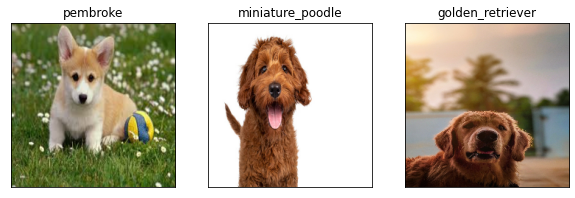

In [129]:
# Check custom images predictions
plt.figure(figsize = (10,10))
for i , image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)